In [1]:
import numpy as np
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
from wave_prop_module import Wave2d
from torch import optim
from unet import UNet
from loss_fns import *

In [2]:
def gaus2d(x=0, y=0, mx=0, my=0, sx=1, sy=1):
    return 1. / (2. * torch.pi * sx * sy) * torch.exp(-((x - mx)**2. / (2. * sx**2.) + (y - my)**2. / (2. * sy**2.)))

In [56]:
model = UNet(num_input_channels=1, num_output_channels=1) # postprocessor

# complete model
device = torch.device('cuda:0')

# incident wave
X, Y = np.meshgrid(np.linspace(-1, 1, 1024), np.linspace(-1, 1, 1360))

A = torch.tensor([X.T.ravel(), Y.T.ravel(), X.T.ravel()*Y.T.ravel(), X.T.ravel()*X.T.ravel(), Y.T.ravel()*Y.T.ravel(), np.ones_like(X.T.ravel()), 
              (X.T.ravel())**3, (Y.T.ravel())**3, X.T.ravel()*(Y.T.ravel())**2, Y.T.ravel()*(X.T.ravel())**2], dtype=torch.float32).T

wave_amp_coef = torch.tensor([30, 0., 0., 3, 3], requires_grad=True)

# coeffs = torch.rand(10, 1, requires_grad=True)
coeffs = torch.FloatTensor(10, 1).uniform_(-1, 1)
# coeffs = torch.tensor([[ -13.53],
#         [-113.3250],
#         [ -12.7425],
#         [   4.4154],
#         [   6.2158],
#         [ -119.261],
#         [   2.3329],
#         [  1.3617],
#         [   1.5364],
#         [  3.5796]])
coeffs.requires_grad=True

# obj_amp = torch.rand(1024, 1360, requires_grad=True)
obj_phase = torch.rand(1024, 1360, requires_grad=True)
obj_amp = torch.rand(1024, 1360, requires_grad=True)

phase_img = np.load('phase_0_lens1493.npy')
abs_img = np.load('abs_0_lens1493.npy')

target_phase = torch.tensor(phase_img).T
target_abs = torch.tensor(abs_img).T

# target_abs = torch.real(torch.tensor(abs_img).T*torch.exp(1j*torch.tensor(phase_img).T))
# target_phase = torch.imag(torch.tensor(abs_img).T*torch.exp(1j*torch.tensor(phase_img).T))


cons = torch.tensor(3.2, requires_grad=True)
# dist = torch.tensor(145.003) # mm 

optimizer = optim.Adam([
    {'params': obj_phase, 'lr': 1e-1},
    {'params': obj_amp, 'lr': 1e-1},
    # {'params': wave_amp_coef, 'lr': 1e-3},
    {'params': coeffs, 'lr': 10},
    {'params': cons, 'lr': 1e-2},
    # {'params': dist, 'lr': 1e-2}
    ],
    lr=0.01, betas=(0.9, 0.999)
    )
optimizer_proc = optim.Adam([
    {'params': model.parameters(), 'lr': 2e-2}],
    lr=0.01, betas=(0.9, 0.999)
    )

scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=100, gamma=0.5)

wave_obj = Wave2d(
        numPx = list(obj_phase.shape), 
        sizePx = [6*1e-3, 6*1e-3], 
        wl = 550*1e-6
        )

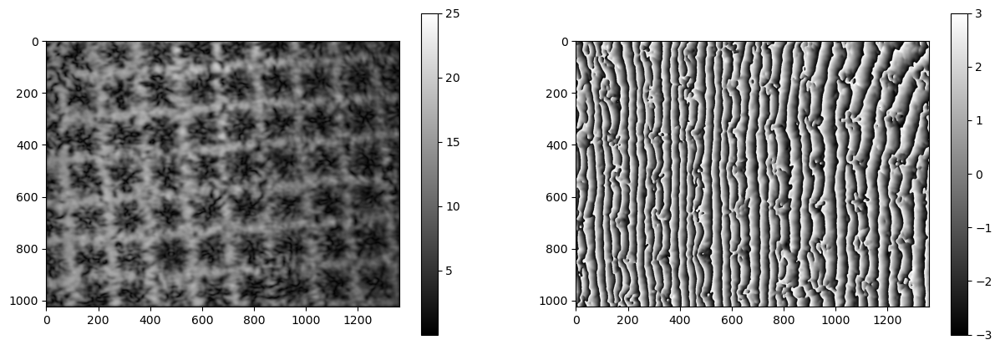

In [57]:
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

cm0 = axs[0].imshow(target_abs.detach().T.abs(), vmax=25,  cmap='gray')
cm1 = axs[1].imshow(target_phase.detach().T, vmax=3, vmin=-3, cmap='gray')
# , vmin=-3, vmax=3
fig.colorbar(cm0, ax=axs[0])
fig.colorbar(cm1, ax=axs[1])

In [58]:
# obj_amp.shape, obj_phase.shape, wave.shape, wave_at_img.shape, target_abs.shape

torch.abs(torch.tensor([-3, 2.]))

tensor([3., 2.])

0 1.0976292443118147


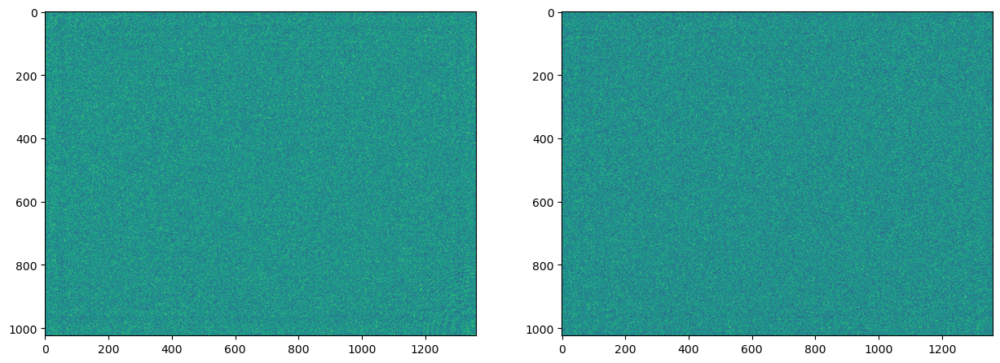

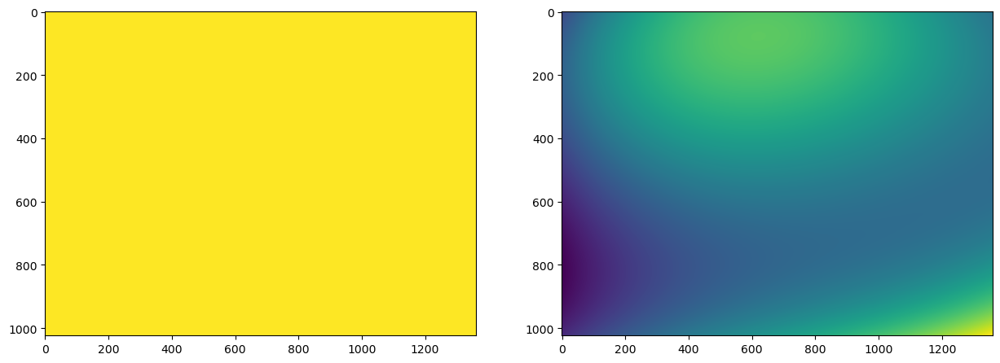

1 0.9084274015926406
2 0.7886641061476782
3 0.7386181852164511
4 0.7155850459773248
5 0.6953216064617406
6 0.6739529855578021
7 0.6511882612957984
8 0.6291850688132543
9 0.6098156761517198
10 0.5922502629131932
11 0.5775574643751694
12 0.5645036567043265
13 0.5539313884717458
14 0.5424754912479839
15 0.5315282143114131
16 0.5215125230597093
17 0.5150142567210789
18 0.5062540332701753
19 0.4966099710048292
20 0.491712930593182
21 0.48461670686675296
22 0.477673118333629
23 0.47259347483179726
24 0.46403871977788347
25 0.457755539811652
26 0.45383094227579973
27 0.45354144263347335
28 0.44960593516939396
29 0.4399635855912508
30 0.4430999173700295
31 0.4356874607638778
32 0.4322265374464998
33 0.43420233351136095
34 0.42628287157682604
35 0.42608735190593544
36 0.4217338824017795
37 0.41902560461545624
38 0.41822145900170804
39 0.4130832309303177
40 0.4133301928800946
41 0.41090254569375095
42 0.4107885396725406
43 0.40760222595095386
44 0.40583071175144214
45 0.4056395734148137
46 0.402

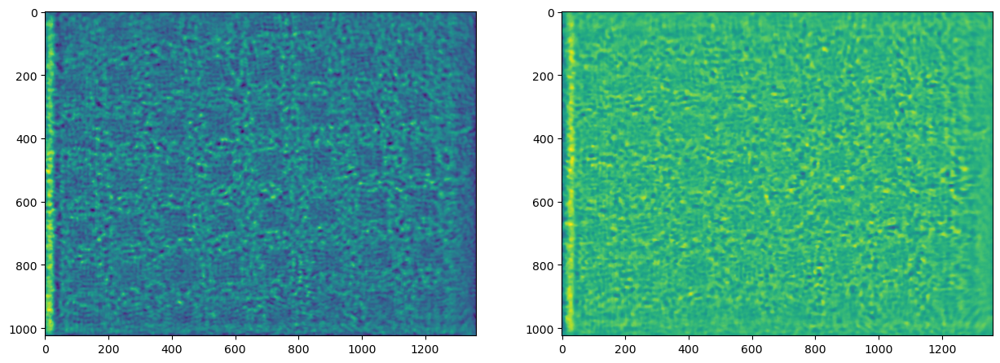

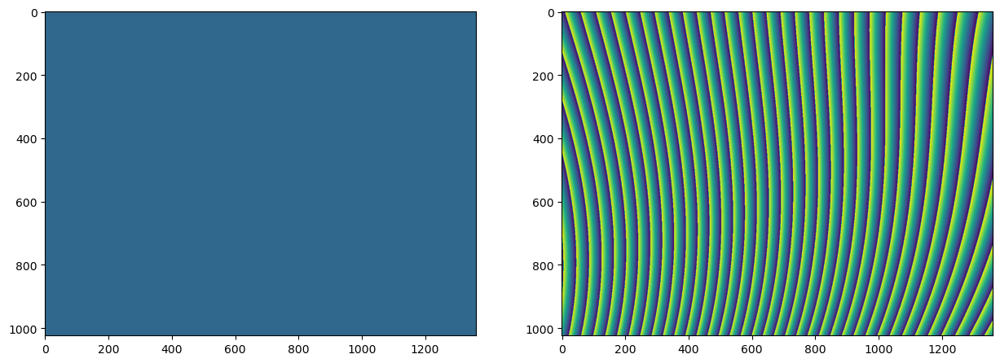

51 0.40459299651891323
52 0.3981383144995252
53 0.395995865912509
54 0.39489882212398764
55 0.3991594378227479
56 0.39939723746945655
57 0.392812031253831
58 0.39339279412629197
59 0.3913198479466891
60 0.3897070208929675
61 0.3900807590077747
62 0.3947831916867054
63 0.38936166929000987
64 0.39310461861362167
65 0.3890064463216282
66 0.39058085887769955
67 0.38860458433451284
68 0.3877890967148814
69 0.38716177691739395
70 0.3918443378684513
71 0.39227378549480985
72 0.3888304878196746
73 0.38716219310848443
74 0.3860171589340787
75 0.386084650397294
76 0.3904372868729085
77 0.3863389233254364
78 0.3917576725326708
79 0.387230731463049
80 0.385967169603217
81 0.3852175656126271
82 0.3847491108793888
83 0.3837986299385459
84 0.3817383283867114
85 0.3803129860120696
86 0.3824240111126962
87 0.3846567816796544
88 0.38826164860535944
89 0.3874379052755725
90 0.3795158085958739
91 0.3793653990869873
92 0.3919046056926434
93 0.380294448625845
94 0.3929286019402637
95 0.38088761771706026
96 

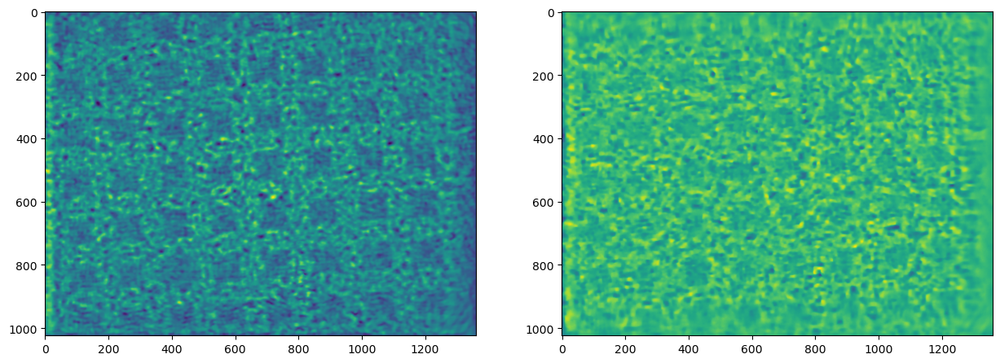

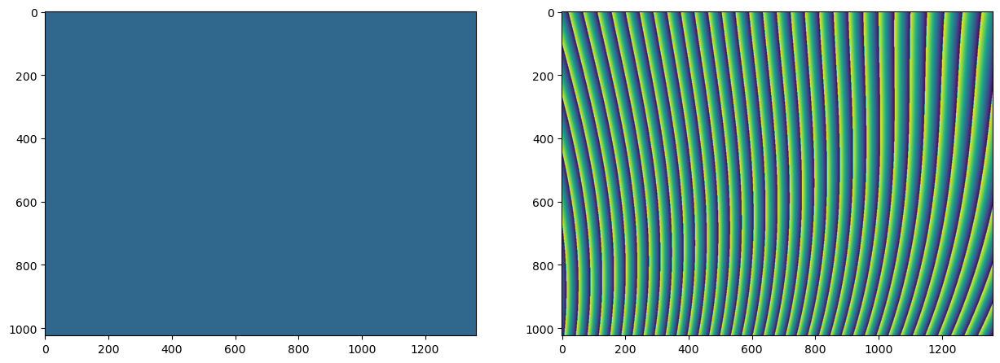

101 0.3799532866731561
102 0.37286663511394214
103 0.37052882734609405
104 0.371538820744976
105 0.37036494462518205
106 0.36885133714893004
107 0.3681471216459181
108 0.36606435444186647
109 0.3654169184648649
110 0.3643703141999715
111 0.36356337807396083
112 0.36256094284590634
113 0.361702713965334
114 0.36118891002423936
115 0.3610875344125472
116 0.3612768153406142
117 0.36057227632831756
118 0.35923417627210724
119 0.35823045852590774
120 0.3579901326002586
121 0.35827854700869866
122 0.35838332233508136
123 0.3572653932001969
124 0.35628219264121613
125 0.3562135781284571
126 0.3569718513908873
127 0.3567452799243475
128 0.3553030710485925
129 0.3547929805318253
130 0.3549569230523989
131 0.35479987598459223
132 0.35457716377128856
133 0.3552577801793741
134 0.35644623975940154
135 0.35510139412010816
136 0.35333116293031275
137 0.35285262870868195
138 0.3533011864746358
139 0.3537877315027244
140 0.35365675149405335
141 0.35266969933318304
142 0.3518044280183375
143 0.35150323

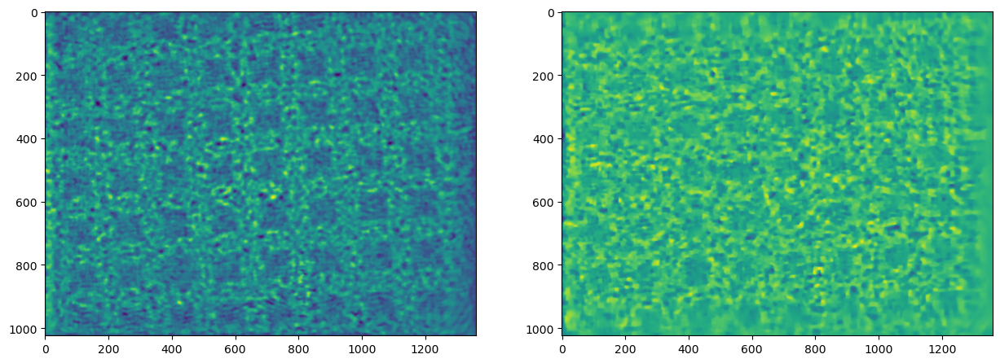

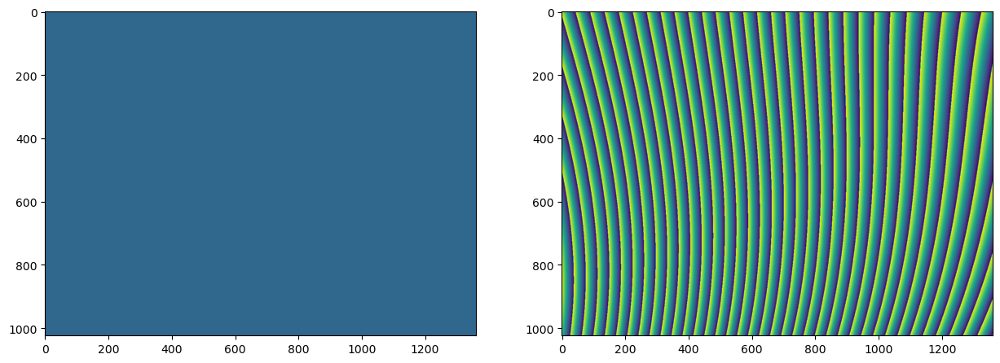

151 0.3503221978547961
152 0.3508509902174465
153 0.3515220625138321
154 0.35119821174984583
155 0.35136739662005756
156 0.35132967588908864
157 0.3516248422086402
158 0.3523456394218272
159 0.35380006493167326
160 0.35411912096591674
161 0.3531887093157101
162 0.3519396552088326
163 0.3527542920617367
164 0.35350194711860633
165 0.3522491574143558
166 0.35066471295258705
167 0.3505003398062604
168 0.35134653771093555
169 0.3506293129156375
170 0.34894604304151366
171 0.347942801689175
172 0.3476283229721716
173 0.3481208820584819
174 0.34879182503318495
175 0.34844893975622965
176 0.34801906436278623
177 0.34808405249414626
178 0.34865503331703807
179 0.34820073106616756
180 0.34694929287830967
181 0.3456180584791887
182 0.3453009402386624
183 0.3464876502952867
184 0.34745690421502096
185 0.34624524403185997
186 0.34495750573578404
187 0.3448004732112904
188 0.345155901043525
189 0.34561148828712035
190 0.3455732903670242
191 0.3446060910725234
192 0.34414733014623194
193 0.344712576

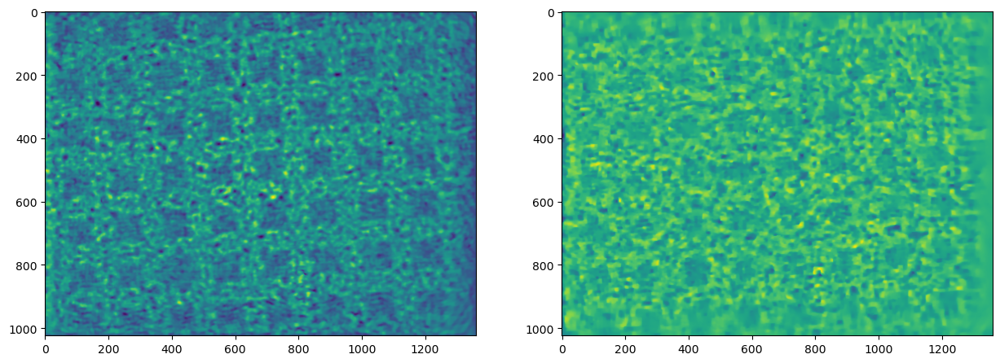

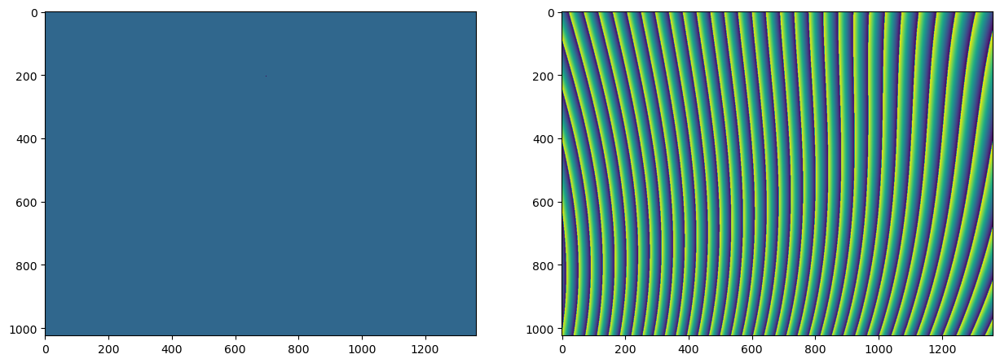

201 0.3400879408581104
202 0.34011660837785457
203 0.33894996751078665
204 0.3393176895551989
205 0.3380387653040985
206 0.3380191410572905
207 0.3373149225323891
208 0.3370241419172473
209 0.33653567019260544
210 0.3361504335429435
211 0.33585662781687814
212 0.3354858393327507
213 0.33523981857908824
214 0.3350019891600689
215 0.3347635022213625
216 0.33452245295557725
217 0.3343479905638985
218 0.33429675117349256
219 0.33448173077308085
220 0.3345352391309386
221 0.3342822733154075
222 0.33381980341540374
223 0.3336779252409109
224 0.33366907391149725
225 0.3336925733759374
226 0.333536218028668
227 0.3333047660113762
228 0.33306475540985075
229 0.3328853753988652
230 0.33286031777759484
231 0.333050226928284
232 0.33363954089100134
233 0.33359672287440395
234 0.33333974193528154
235 0.33326041308890963
236 0.33324705286943446
237 0.33314503630778003
238 0.3327957660013791
239 0.33256388561674854
240 0.3323259592617578
241 0.3322255936248434
242 0.3323041497972458
243 0.33235004430

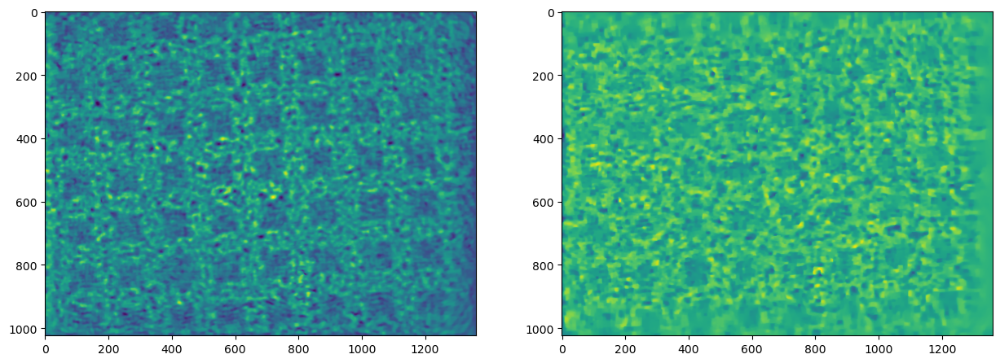

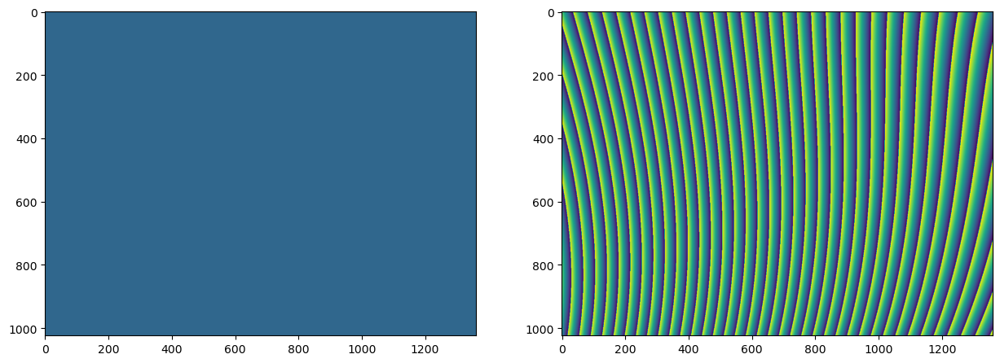

251 0.33134800912338935
252 0.33148642898012076
253 0.3314701345184577
254 0.33122654455808254
255 0.3312056643616891
256 0.33116689915321534
257 0.3309553531426536
258 0.3306286035442635
259 0.3303158268887854
260 0.33018635614924147
261 0.33009162052344077
262 0.330499225169047
263 0.3313707311804717
264 0.33175677654134417
265 0.33076897883808065
266 0.3300907103269652
267 0.330042079062249
268 0.33033631870328933
269 0.33042307153549444
270 0.3301651558968235
271 0.329781747637665
272 0.329555698481837
273 0.3295046004172746
274 0.32947976487052993
275 0.3295344978324422
276 0.32952579186946324
277 0.3295286343459833
278 0.32931255941684584
279 0.3289994697156734
280 0.329012107137302
281 0.32917404515995324
282 0.32924599723078884
283 0.3289376953772395
284 0.32869974223811876
285 0.32862372468465323
286 0.3286500241843725
287 0.3288521532252068
288 0.32871931410397964
289 0.32826944090978893
290 0.32787343406803343
291 0.32760485855824906
292 0.327517150107849
293 0.3275915234379

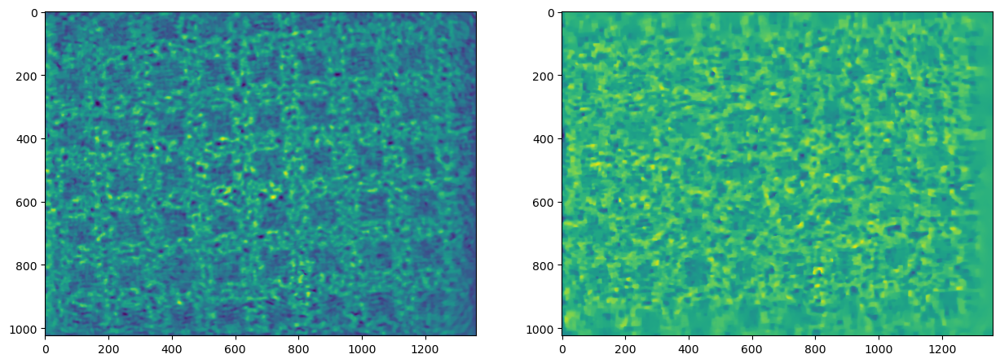

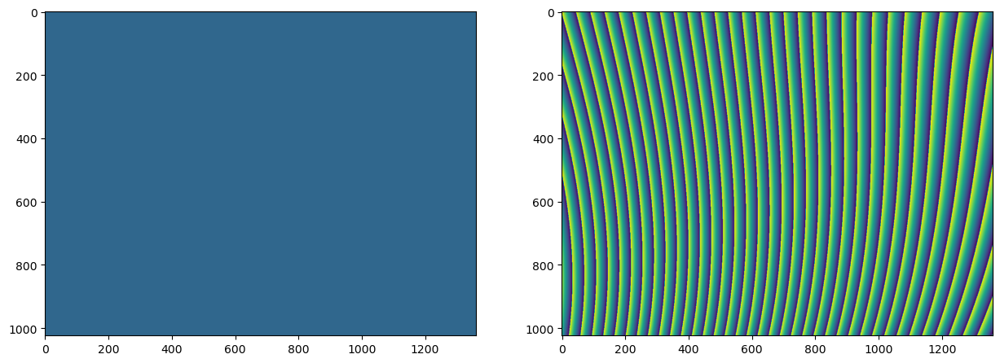

301 0.32593255950207967
302 0.3256789385132522
303 0.3254419252845569
304 0.3253334569132762
305 0.3248302191795973
306 0.3248201534277432
307 0.3244493499166214
308 0.3243631753580854
309 0.3240760486628247
310 0.32391765888255386
311 0.3237533245486773
312 0.32354346478405405
313 0.32344000319959965
314 0.3232806250386027
315 0.3231343644053339
316 0.3230179479476133
317 0.3229262949082098
318 0.32289209665648766
319 0.3228617774641206
320 0.3228889168466038
321 0.32292326495952633
322 0.3228798663808753
323 0.32272751452400095
324 0.3226072288371105
325 0.3225472999972537
326 0.3225429624198408
327 0.3225720393250085
328 0.3225525241473588
329 0.32251519098367576
330 0.3223858391234314
331 0.32231227637538673
332 0.3222559019709836
333 0.3222521348952031
334 0.32221210567643593
335 0.322230438031909
336 0.3221728994410614
337 0.32207733709125985
338 0.32199432067011324
339 0.32195857902923586
340 0.32196303158329487
341 0.32222215631515194
342 0.3222604977049149
343 0.32202685853373

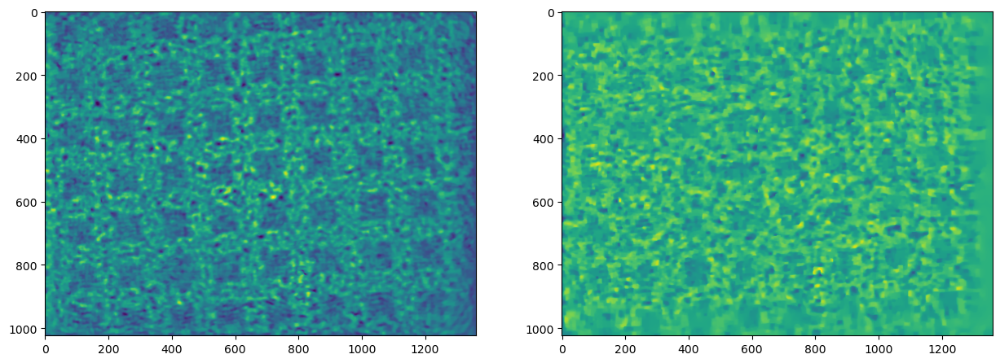

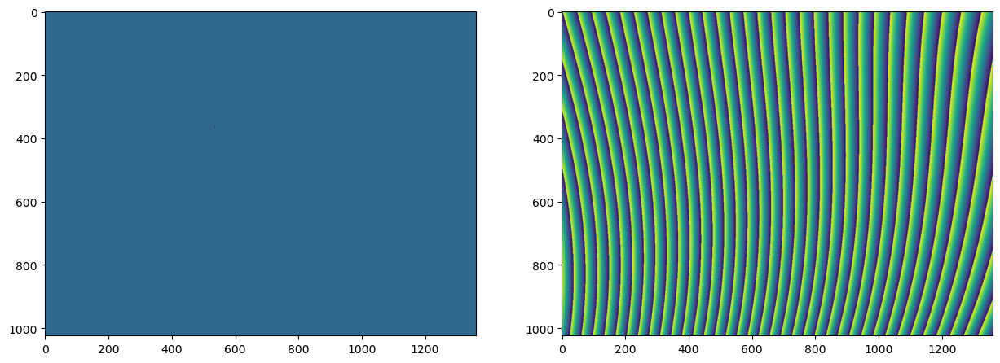

351 0.321444812935506
352 0.32136749404950504
353 0.32132108292955047
354 0.3212791077858156
355 0.321217809396163
356 0.3211706425306627
357 0.3212100753083652
358 0.3213082533829099
359 0.3213047296933971
360 0.3211251544078637
361 0.32098833006853283
362 0.3210054670893327
363 0.3211230770975769
364 0.32134235981377784
365 0.3214538879467391
366 0.3215319955592812
367 0.3214721944337138
368 0.3212915021363194
369 0.3211955413708961
370 0.3211191344731931
371 0.3210205700037233
372 0.3208982749797404
373 0.3208393668372783
374 0.32070496944196003
375 0.32060982631513196
376 0.3205734015497164
377 0.3205348726282094
378 0.3206425445326122
379 0.3206461402433435
380 0.32055778656849176
381 0.3204056798615298
382 0.3203658445735005
383 0.32032136457400445
384 0.32027007890313636
385 0.3202417766539789
386 0.3201281097453031
387 0.32004475055021175
388 0.31998047585910766
389 0.3199879715471302
390 0.3200952532729288
391 0.320344052866307
392 0.32030331293532727
393 0.3199758336264514
39

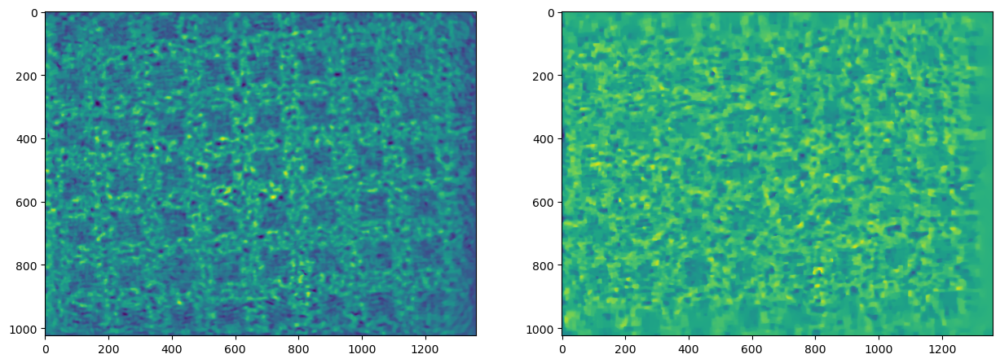

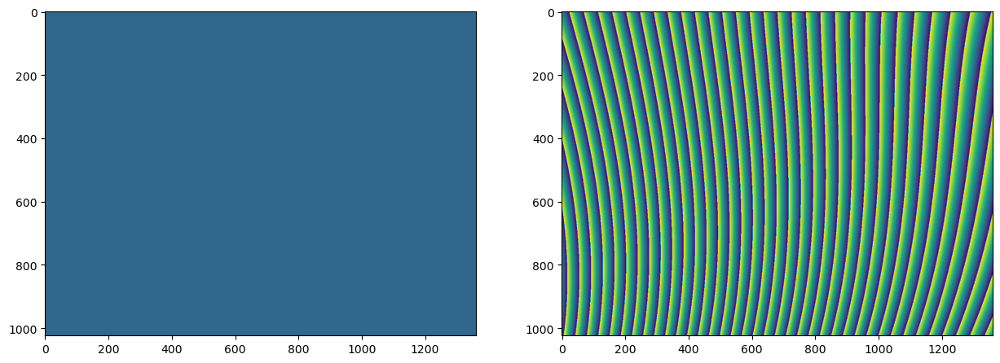

401 0.3188609884553428
402 0.3186147785356635
403 0.3186198027261414
404 0.3185137025005903
405 0.3183210050956695
406 0.3182372409414159
407 0.3181238818273444
408 0.31801310805661054
409 0.3179380208078417
410 0.3178349657341828
411 0.31774352599156613
412 0.31766942942740667
413 0.3176098512275892
414 0.3175478838087295
415 0.3174772769055816
416 0.3174158020051343
417 0.31738976361615895
418 0.31734772299081276
419 0.317347828971834
420 0.31734110589699144
421 0.31735249638376517
422 0.31736646501631127
423 0.317340532367154
424 0.3172721695590245
425 0.31722072553212555
426 0.3172090071117924
427 0.3172073408882155
428 0.3172127487898587
429 0.31717488278056427
430 0.3171644377652807
431 0.3171222563677929
432 0.31710104357501845
433 0.31704095478902034
434 0.3170383186786785
435 0.31699298027287914
436 0.3169857098128298
437 0.3170080226448046
438 0.31700054129839417
439 0.31698124363853636
440 0.31691286366877464
441 0.3168740613325706
442 0.31684046656475273
443 0.3168055541362

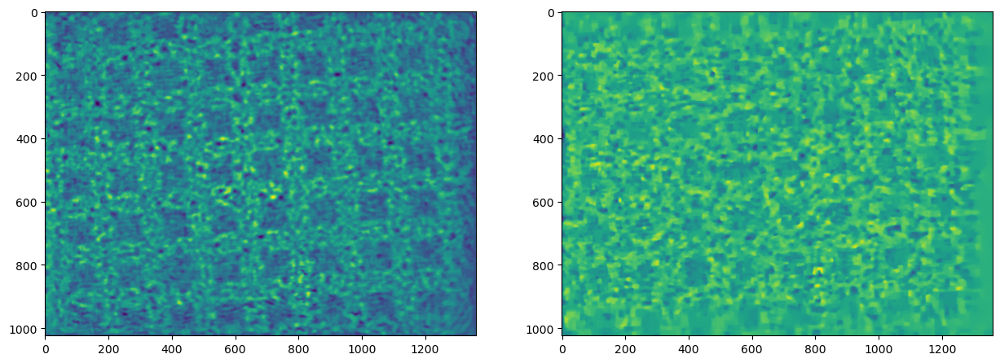

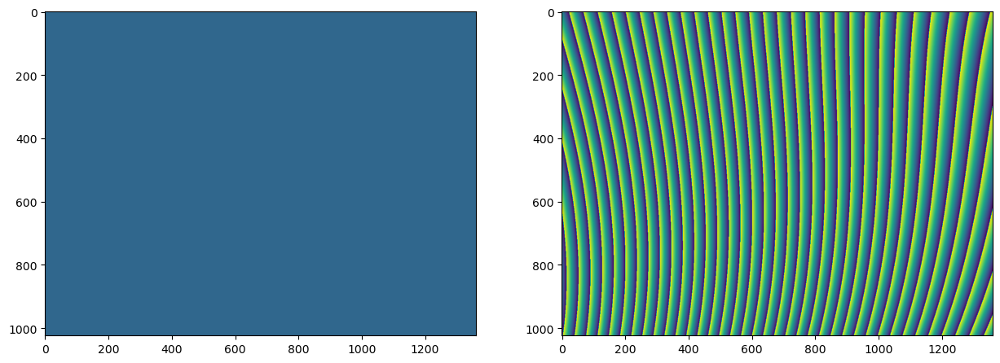

451 0.3167752566726778
452 0.3167498142987727
453 0.316709687083322
454 0.3166782250143532
455 0.3166659026977043
456 0.3166247913912419
457 0.31665537652110193
458 0.3166623282374781
459 0.31666606054245156
460 0.3165663815466325
461 0.3165112930521751
462 0.3164868896302304
463 0.3164838726614017
464 0.3164783049367639
465 0.31646133746440697
466 0.3164367006608073
467 0.31637799294793595
468 0.3163246751381715
469 0.31631541935658275
470 0.31630559491166504
471 0.3164197079177446
472 0.3165801024999694
473 0.31669772412426317
474 0.3165289615724983
475 0.3164991490484723
476 0.3165058549027892
477 0.31655680058486
478 0.3165316418723086
479 0.31641495473387204
480 0.3163409690710657
481 0.31631042729716996
482 0.3163291542675235
483 0.316277406277518
484 0.3162182129165154
485 0.316171961516386
486 0.3161352606931558
487 0.3160727318337901
488 0.31612414020987656
489 0.316143816997918
490 0.3161855634491141
491 0.31611523943134623
492 0.31598204818133235
493 0.31595898981676185
494 

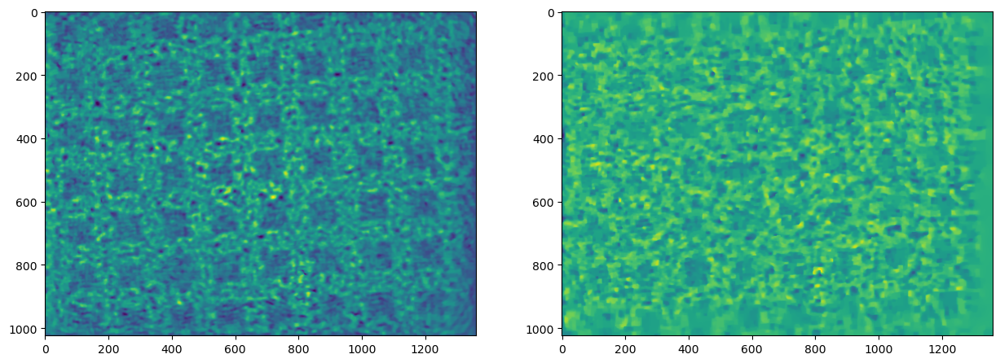

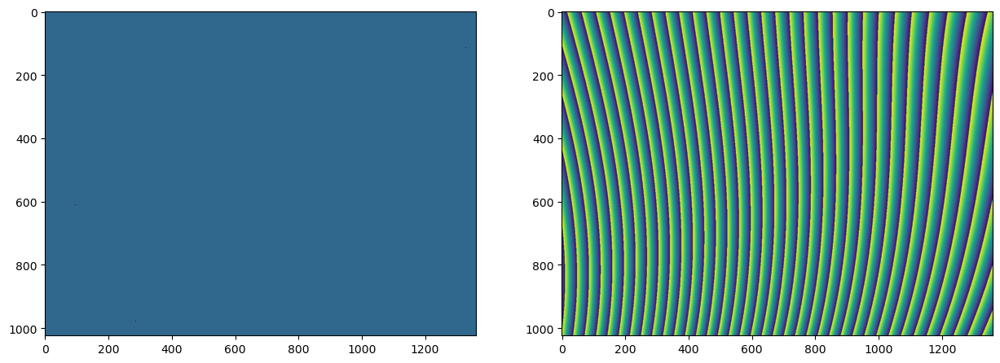

In [59]:
epochs = 501

loss_arr = []
loss_amp_arr = []
loss_phase_arr = []
loss_tv_amp_arr = []
loss_tv_phase_arr = []

wave_amp_coeff_train = []
wave_phase_coeff_train = []

norm_target_abs = 6*(target_abs - target_abs.min())/(target_abs.max() - target_abs.min()) - 3

for itr in range(epochs):

    optimizer.zero_grad()
    # optimizer_proc.zero_grad()

    obj = obj_amp*torch.exp(1j*obj_phase)
    # obj = obj_amp + 1j*obj_phase
    
    wave_phase = ((A)@coeffs).reshape(1024, 1360)

    # wave_amp = wave_amp_coef[0]*gaus2d(torch.tensor(X), torch.tensor(Y), wave_amp_coef[1], wave_amp_coef[2], wave_amp_coef[3], wave_amp_coef[4]).T
    # wave = wave_amp*torch.exp(1j*wave_phase)
    wave = torch.exp(1j*wave_phase)
    
    wave_op = wave*obj

    wave_obj.wavefield(wave_op.T)
    dist = torch.tensor(-135.003) # mm
    wave_at_img = wave_obj.propogate(dist)
    # wave_z += cons
    
    loss_phase = loss_fn(torch.angle(wave_at_img), target_phase)
    # loss_amp = torch.pow(torch.abs(wave_at_img) - norm_target_abs, 2).sum()/obj_amp.ravel().size()[0]
    # loss_amp = torch.abs(torch.abs(wave_at_img) - norm_target_abs).sum()/obj_amp.ravel().size()[0]
    loss_amp = loss_fn(torch.abs(wave_at_img), target_abs)
    loss_TV_phase = total_variation_loss(obj_phase, 0.3, l=1, th=0.2)
    loss_TV_amp = total_variation_loss(obj_amp, 0.1, l=1)

    loss = loss_amp + loss_phase +  loss_TV_amp + loss_TV_phase

    # proc = model(obj_phase.unsqueeze(0).unsqueeze(0)).squeeze()
    # loss_proc = 0.9*l2_loss(proc, obj_phase) + total_variation_loss(proc, 0.1)

    loss.backward()
    # loss_proc.backward()
    
    optimizer.step()
    # optimizer_proc.step()
    scheduler.step()

    loss_arr.append(loss.item())
    print(itr, loss_arr[-1])

    loss_amp_arr.append(loss_amp.item())
    loss_phase_arr.append(loss_phase.item())
    loss_tv_amp_arr.append(loss_TV_amp.item())
    loss_tv_phase_arr.append(loss_TV_phase.item())

    wave_amp_coeff_train.append(wave_amp_coef.detach().clone())
    # print(wave_amp_coef.detach())
    wave_phase_coeff_train.append(coeffs.detach().clone())

    if (itr) % 50 == 0:

        fig, axs = plt.subplots(1, 2, figsize=(15, 8))

        axs[1].imshow(obj_phase.detach())
        # axs[1].imshow(proc.detach())
        axs[0].imshow(obj_amp.detach())
        # axs[1].imshow(torch.angle(obj.detach()))
        # # axs[1].imshow(proc.detach())
        # axs[0].imshow(torch.abs(obj.detach()))
        plt.show()

        fig, axs = plt.subplots(1, 2, figsize=(15, 8))

        axs[1].imshow(torch.angle(wave.detach()))
        # axs[1].imshow(proc.detach())
        axs[0].imshow(torch.abs(wave.detach()))
        plt.show()
        

In [ ]:
# wave_amp.shape, wave_amp_coef, wave_amp_coef.grad

In [ ]:
# dist, cons.grad, coeffs.grad, coeffs

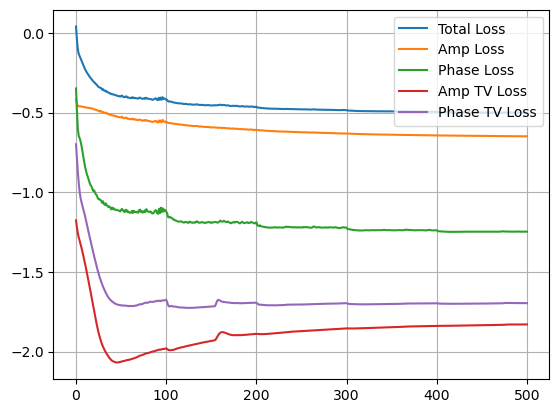

In [60]:
plt.plot(np.log10(loss_arr), label='Total Loss')
plt.plot(np.log10(loss_amp_arr), label='Amp Loss')
plt.plot(np.log10(loss_phase_arr), label='Phase Loss')
plt.plot(np.log10(loss_tv_amp_arr), label='Amp TV Loss')
plt.plot(np.log10(loss_tv_phase_arr), label='Phase TV Loss')

plt.legend()
plt.grid()

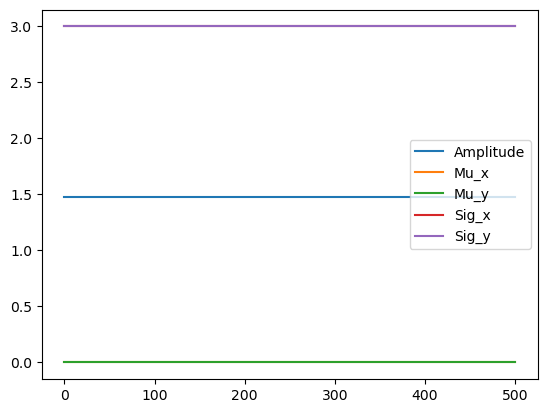

In [61]:
plt.plot(torch.log10(torch.stack(wave_amp_coeff_train)[:, 0]), label='Amplitude')
plt.plot(torch.stack(wave_amp_coeff_train)[:, 1], label='Mu_x')
plt.plot(torch.stack(wave_amp_coeff_train)[:, 2], label='Mu_y')
plt.plot(torch.stack(wave_amp_coeff_train)[:, 3], label='Sig_x')
plt.plot(torch.stack(wave_amp_coeff_train)[:, 4], label='Sig_y')
plt.legend()

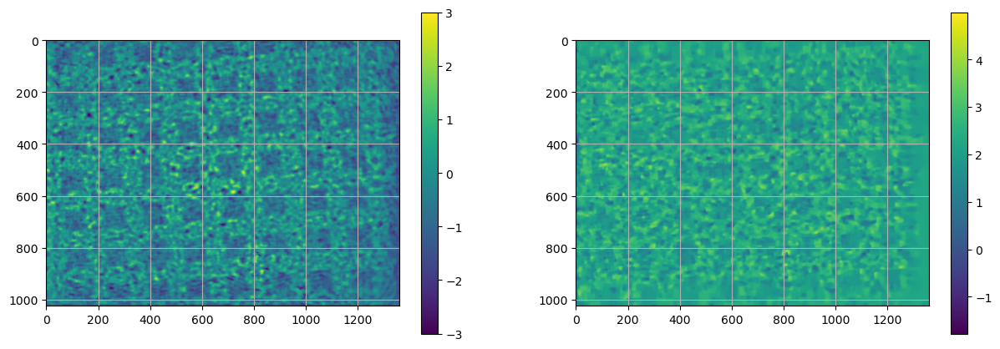

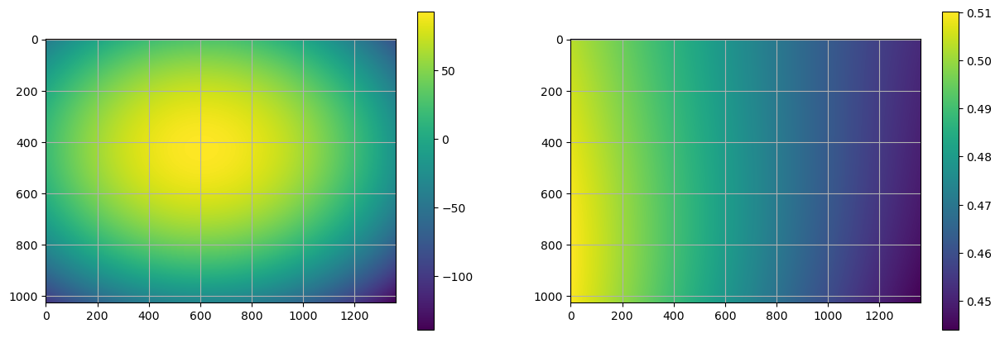

In [62]:
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

cm1 = axs[0].imshow(obj_amp.detach())
cm0 = axs[1].imshow(obj_phase.detach(), vmin=-3, vmax=3)

fig.colorbar(cm0, ax=axs[0])
fig.colorbar(cm1, ax=axs[1])

axs[0].grid()
axs[1].grid()


fig, axs = plt.subplots(1, 2, figsize=(15, 5))

cm1 = axs[0].imshow(wave_amp.detach())
cm0 = axs[1].imshow(wave_phase.detach())
# , vmin=-30, vmax=3
fig.colorbar(cm0, ax=axs[0])
fig.colorbar(cm1, ax=axs[1])

axs[0].grid()
axs[1].grid()

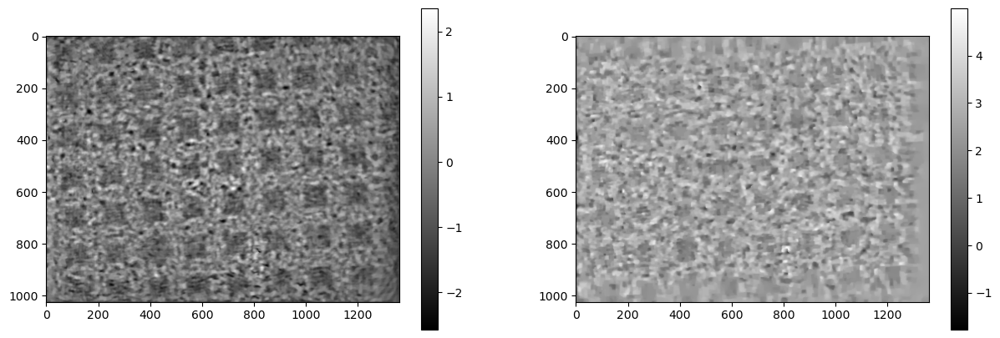

In [63]:
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

cm1 = axs[0].imshow(obj_amp.detach(), cmap='gray')
cm0 = axs[1].imshow(obj_phase.detach(), cmap='gray')
# , vmin=-3, vmax=3
fig.colorbar(cm0, ax=axs[0])
fig.colorbar(cm1, ax=axs[1])

# axs[0].grid()
# axs[1].grid()

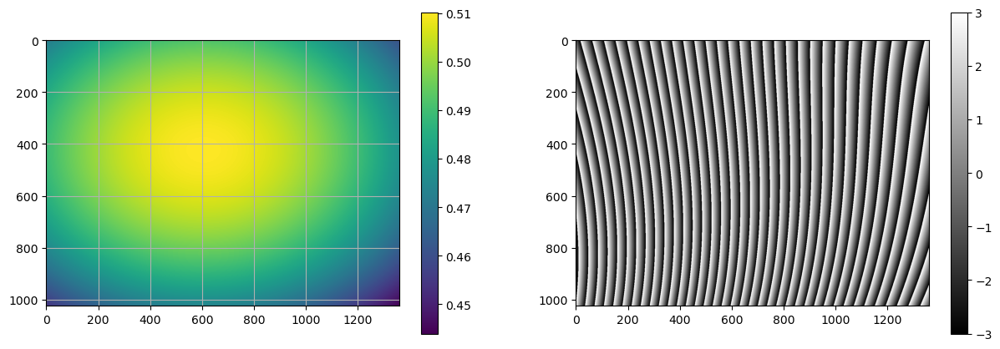

In [64]:
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

cm0 = axs[0].imshow(wave_amp.detach())
cm1 = axs[1].imshow(torch.angle(wave).detach(), vmax=3, vmin=-3, cmap='gray')
# , vmin=-30, vmax=3
fig.colorbar(cm0, ax=axs[0])
fig.colorbar(cm1, ax=axs[1])

axs[0].grid()
# axs[1].grid()

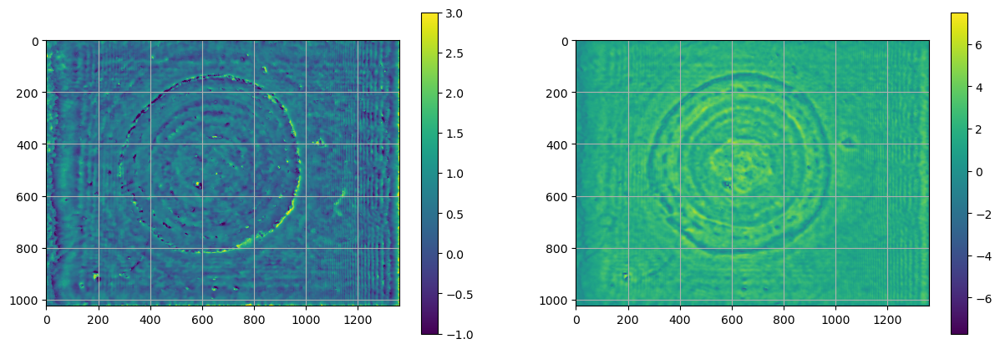

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

cm1 = axs[1].imshow(obj_amp.detach())
cm0 = axs[0].imshow(obj_phase.detach(), vmin=-1, vmax=3)

fig.colorbar(cm0, ax=axs[0])
fig.colorbar(cm1, ax=axs[1])

axs[0].grid()
axs[1].grid()

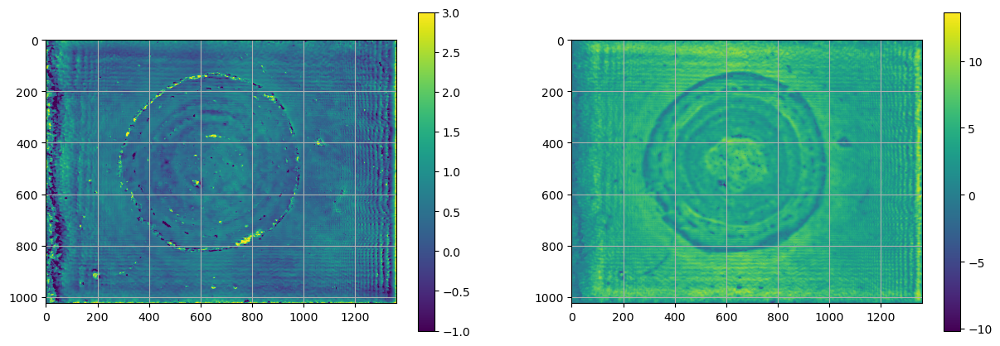

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

cm1 = axs[1].imshow(obj_amp.detach())
cm0 = axs[0].imshow(obj_phase.detach(), vmin=-1, vmax=3)

fig.colorbar(cm0, ax=axs[0])
fig.colorbar(cm1, ax=axs[1])

axs[0].grid()
axs[1].grid()

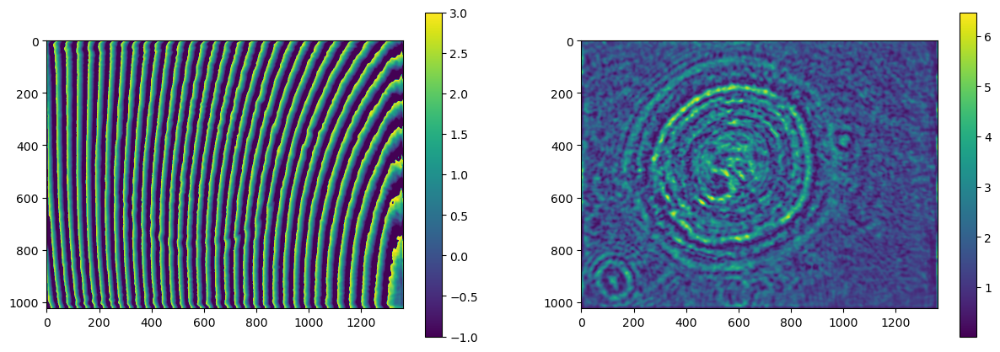

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

cm1 = axs[1].imshow(torch.abs(wave_at_img).T.detach())
cm0 = axs[0].imshow(torch.angle(wave_at_img).T.detach(), vmin=-1, vmax=3)

fig.colorbar(cm0, ax=axs[0])
fig.colorbar(cm1, ax=axs[1])

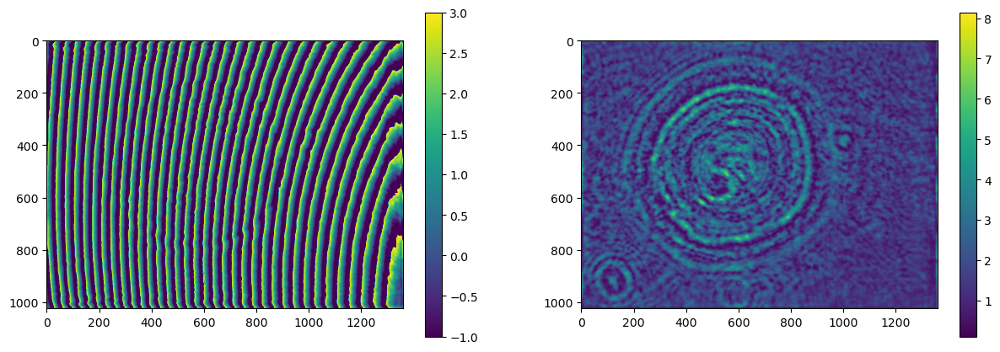

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

cm1 = axs[1].imshow(torch.abs(wave_at_img).T.detach())
cm0 = axs[0].imshow(torch.angle(wave_at_img).T.detach(), vmin=-1, vmax=3)

fig.colorbar(cm0, ax=axs[0])
fig.colorbar(cm1, ax=axs[1])

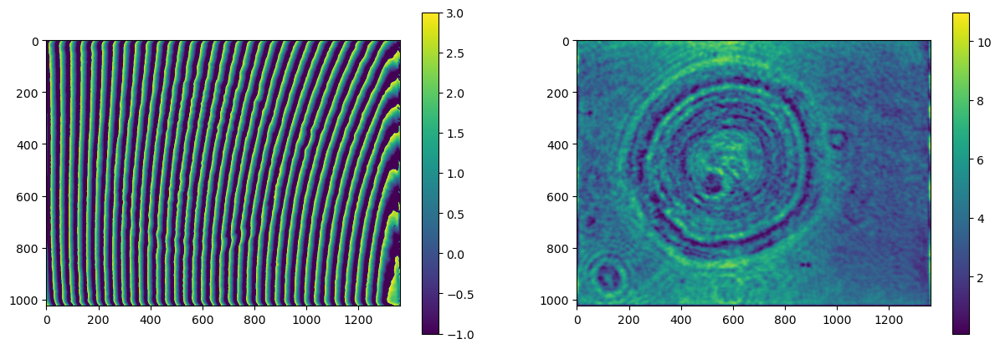

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

cm1 = axs[1].imshow(torch.abs(wave_at_img).T.detach())
cm0 = axs[0].imshow(torch.angle(wave_at_img).T.detach(), vmin=-1, vmax=3)

fig.colorbar(cm0, ax=axs[0])
fig.colorbar(cm1, ax=axs[1])

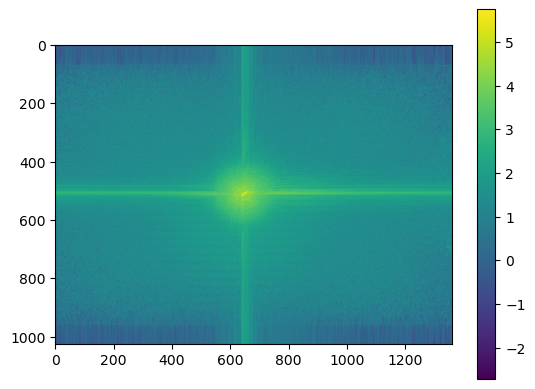

In [ ]:
plt.imshow(np.log10(torch.abs(torch.fft.fftshift(torch.fft.fft2(wave_at_img.detach())))).T)
plt.colorbar()

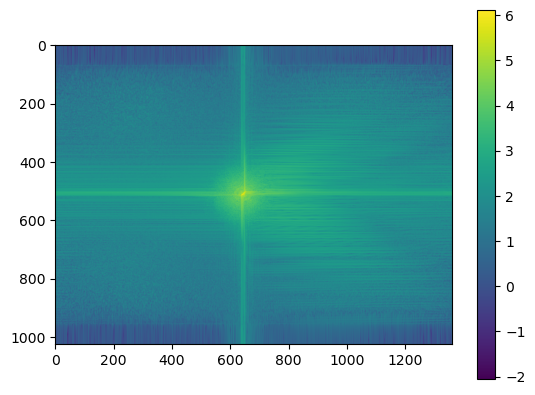

In [ ]:
plt.imshow(np.log10(torch.abs(torch.fft.fftshift(torch.fft.fft2(wave_at_img.detach())))).T)
plt.colorbar()

tensor([[ -12.7241],
        [-114.5435],
        [ -12.9551],
        [   4.7421],
        [   6.8633],
        [-118.1326],
        [   2.3889],
        [   2.4276],
        [   1.5576],
        [   3.9442]], requires_grad=True)

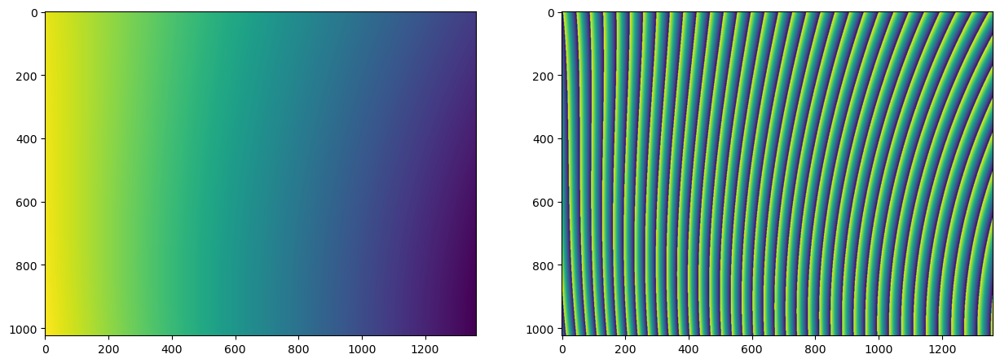

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(15, 8))

axs[1].imshow(torch.angle(wave).detach())
axs[0].imshow(wave_phase.detach())

coeffs

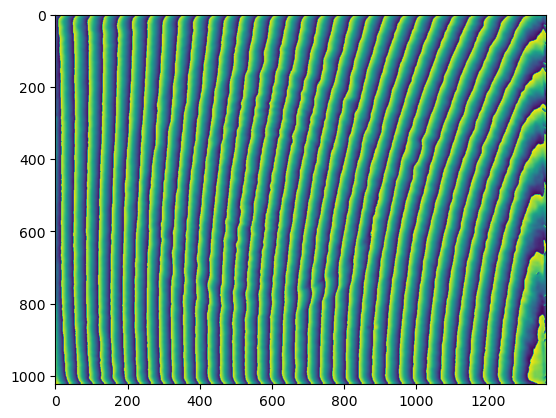

In [ ]:
plt.imshow(wave_z.detach().T)

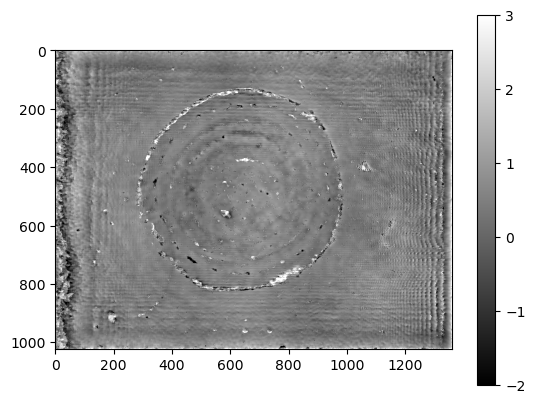

In [ ]:
plt.imshow((obj_phase.detach().numpy()), cmap='gray', vmin=-2, vmax=3)
plt.colorbar()